In [2]:
import numpy as np
import pandas as pd
import re
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 200)

import warnings
warnings.filterwarnings("ignore")

In [3]:
from bs4 import BeautifulSoup
import requests

import missingno as ms
import time
import random
import datetime
from datetime import timedelta

In [4]:
import datefinder
# Example
string_with_dates = "“Family Feud” 11/23/22"
matches = datefinder.find_dates(string_with_dates)
next(matches);

In [5]:
import datetime
from datetime import timedelta
from datetime import datetime

. | . | . | . 
- | - | - | - 
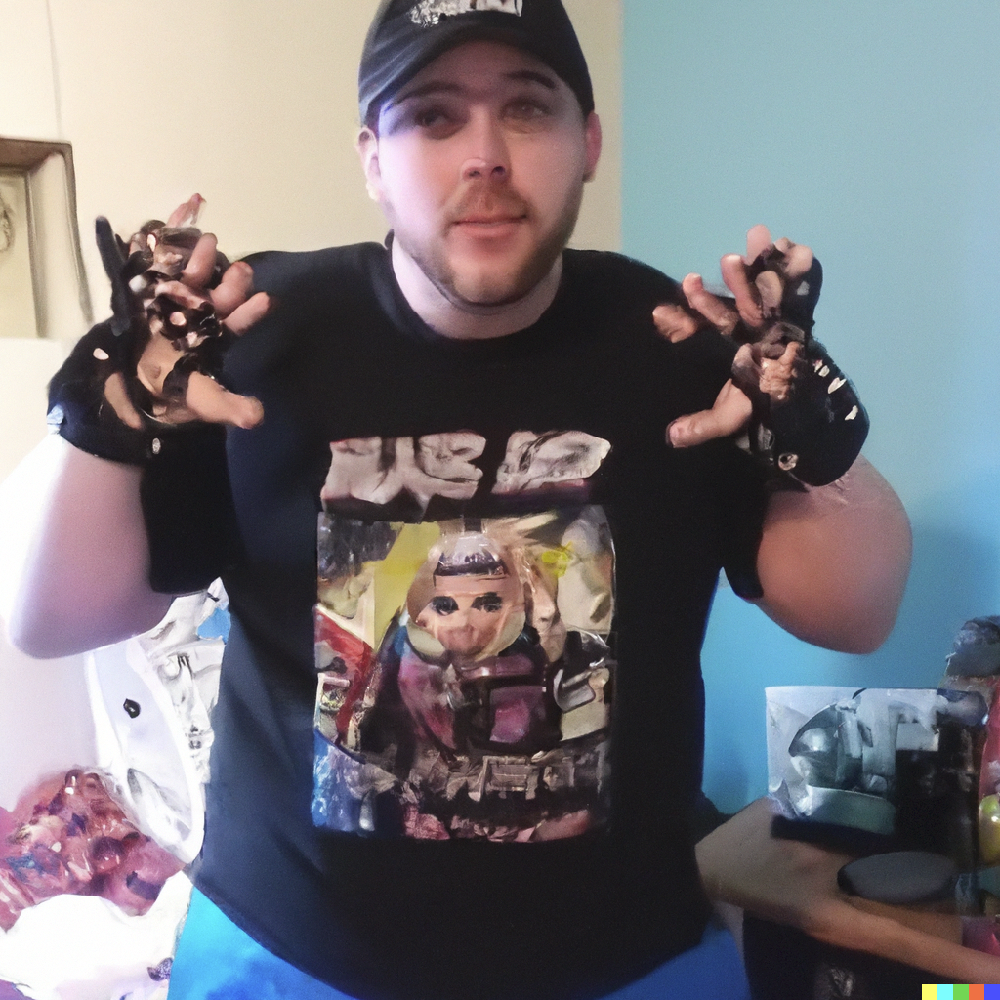 | 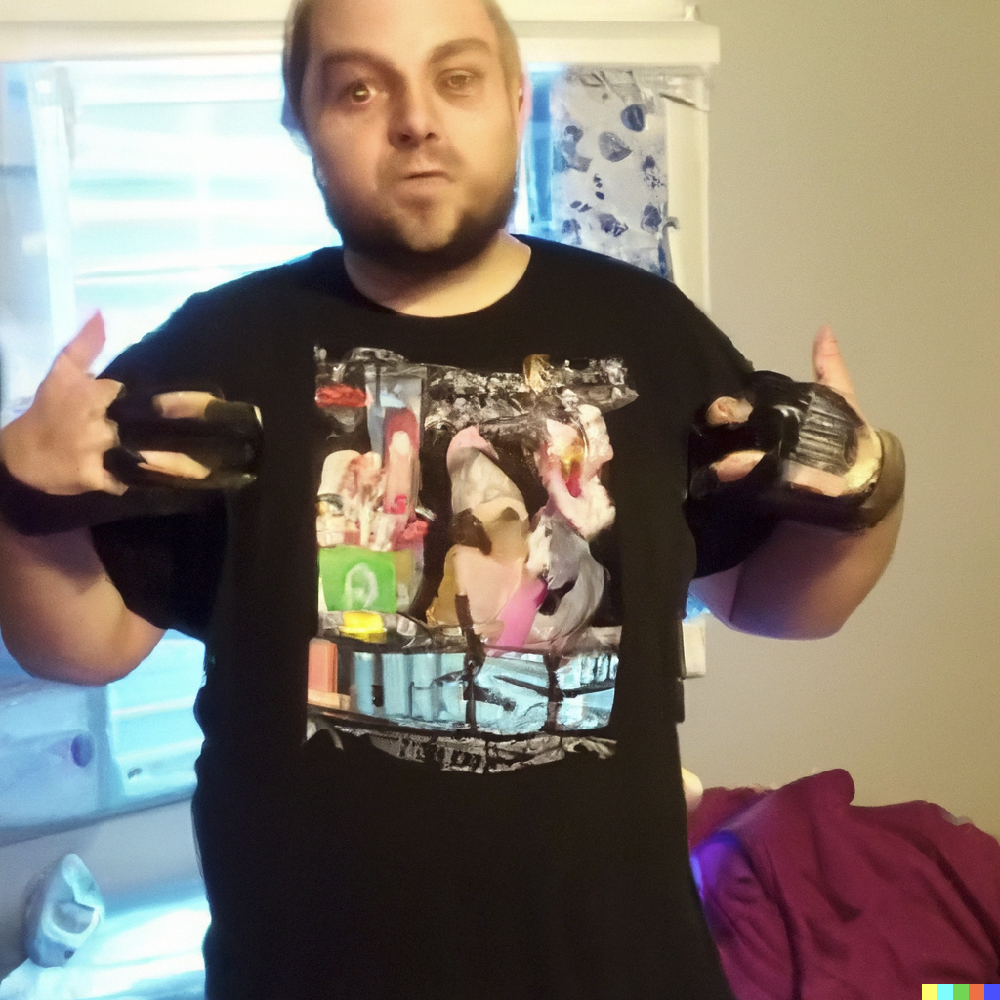 | 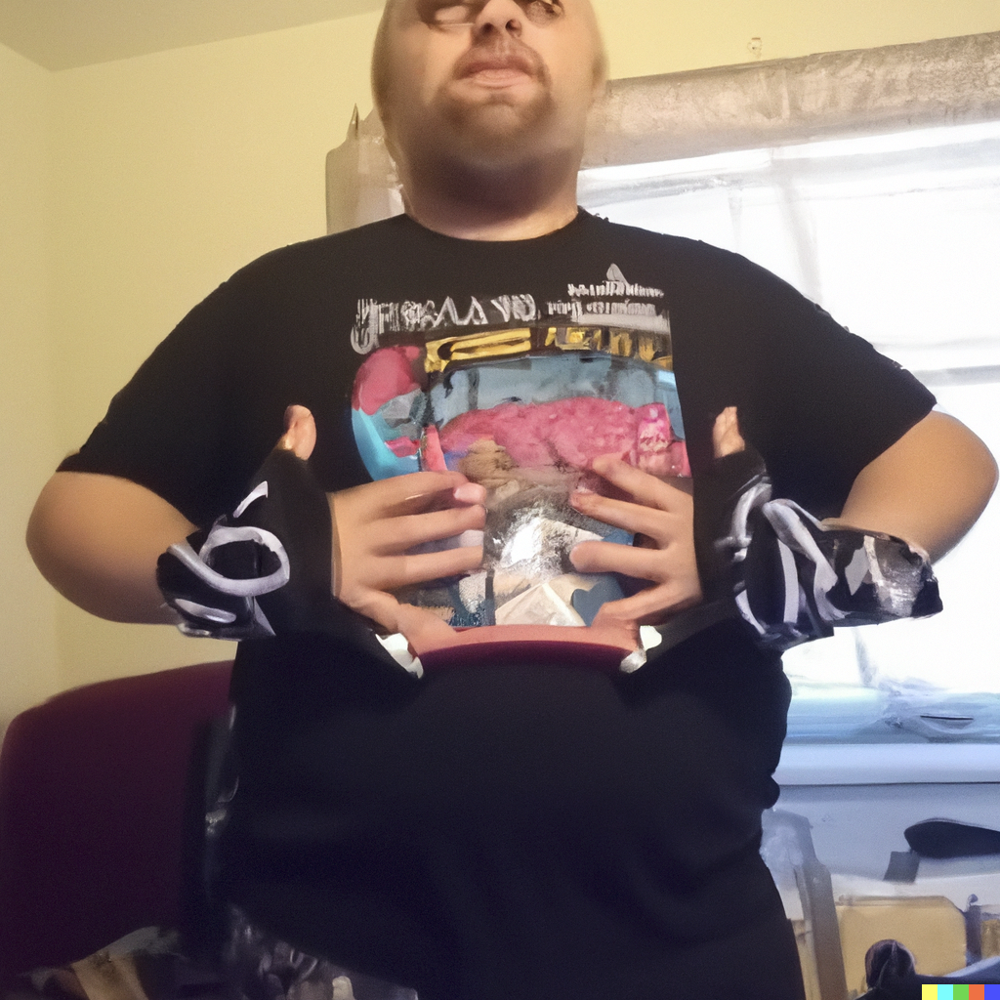


# bobbymgsk

. | . | . | . 
- | - | - | - 
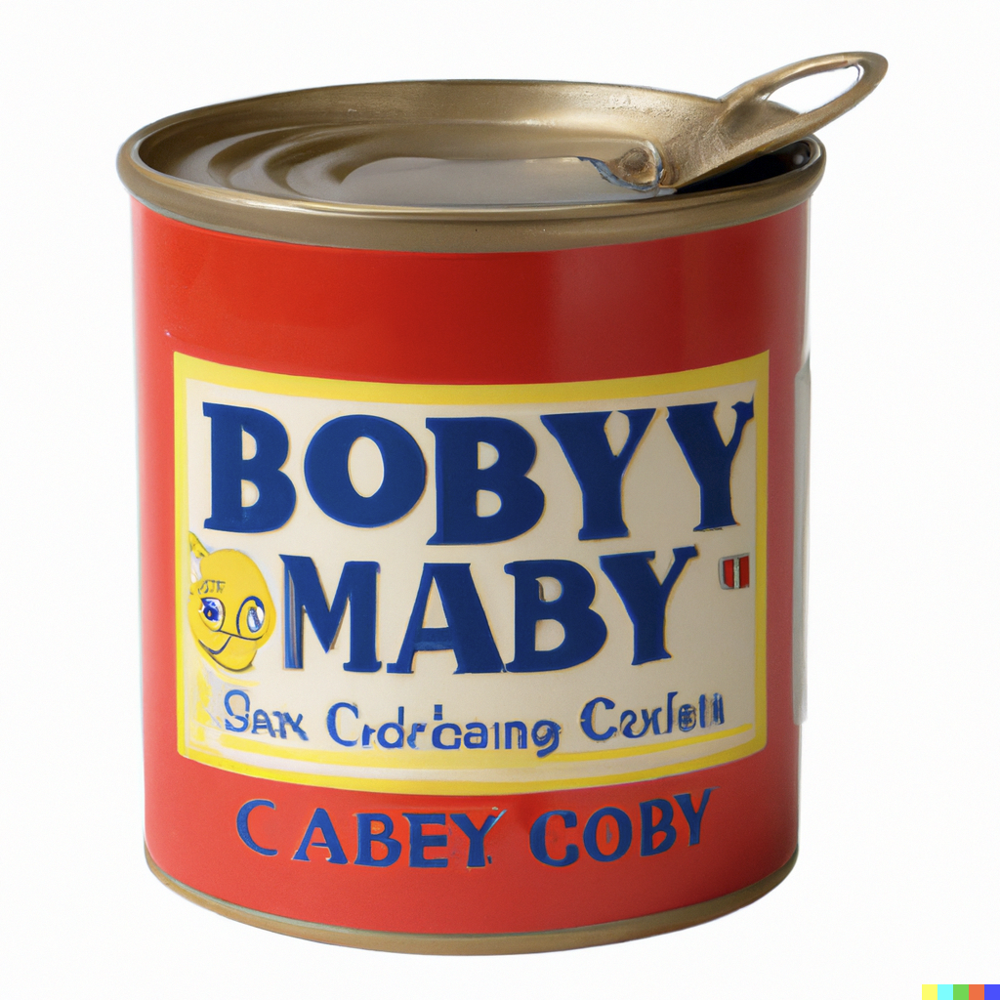 | 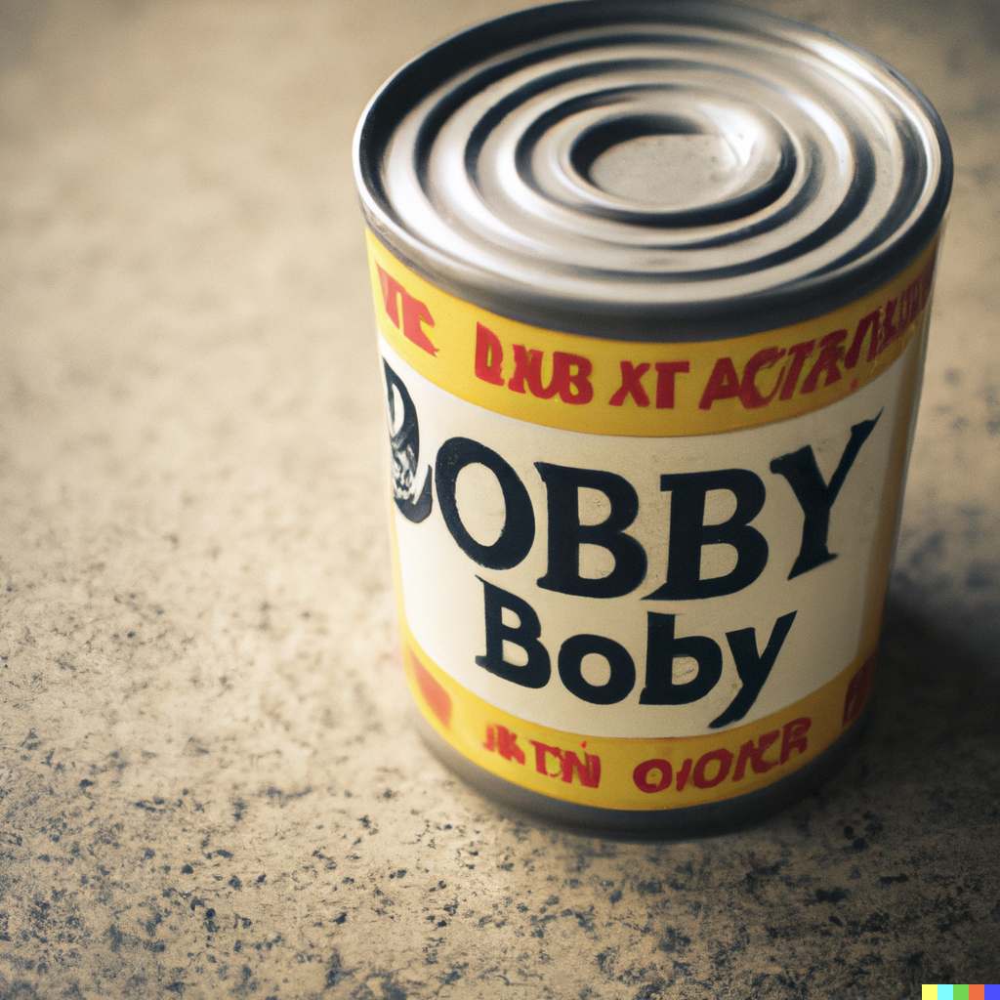 | 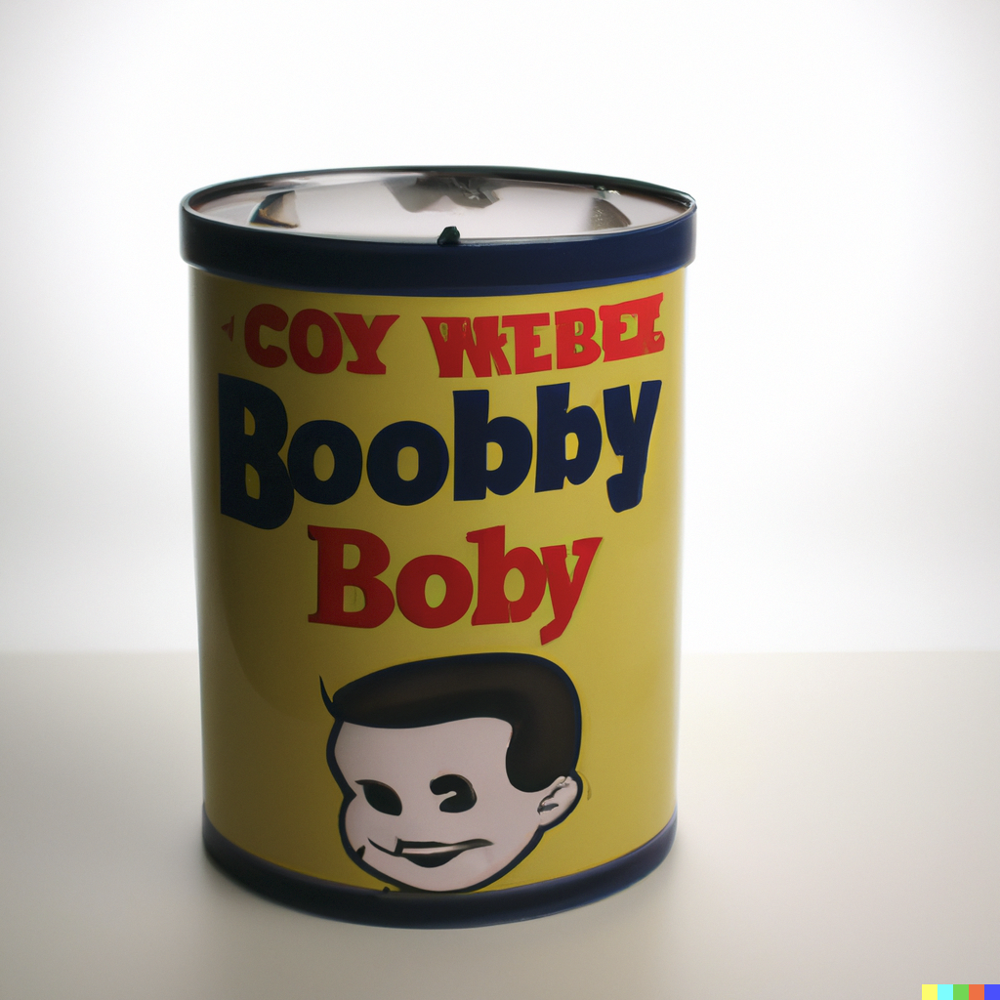 | 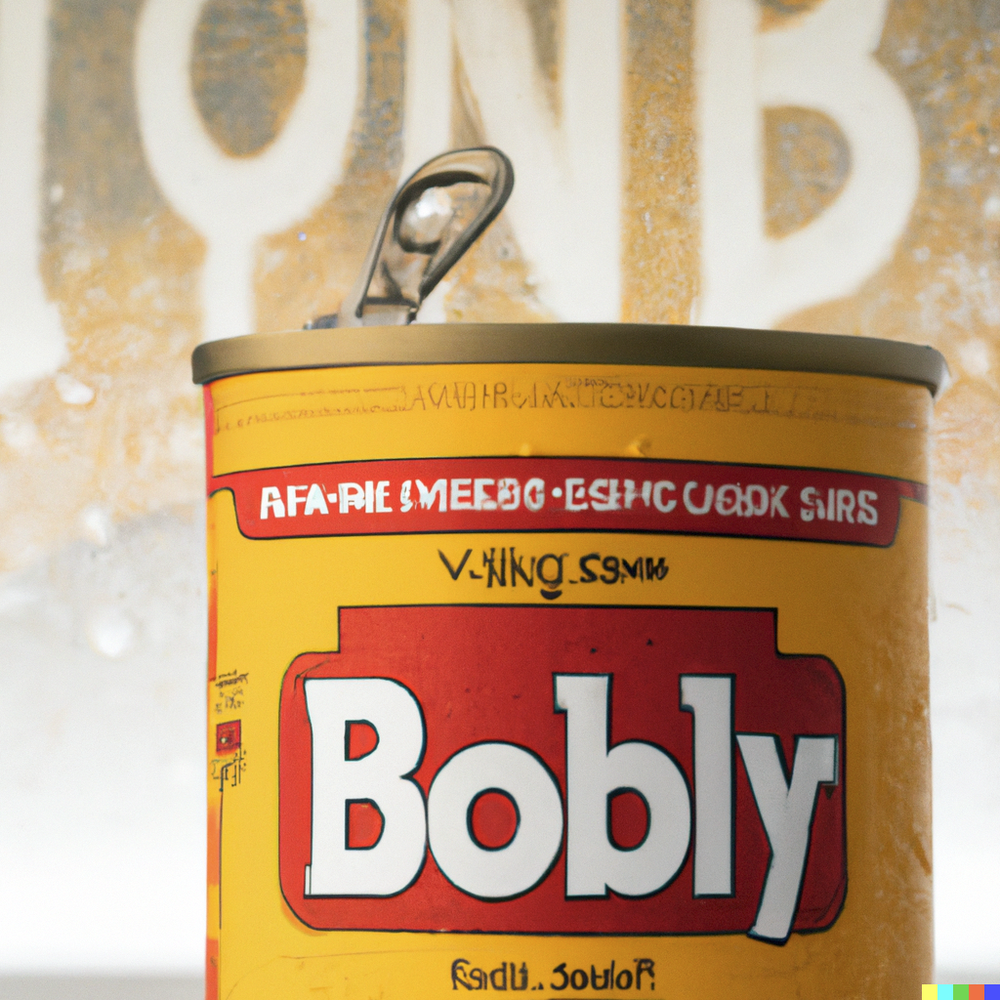

## Bobby Soup


In [253]:
def scrape_bobby_to_soup():
    """ 
    Scrape Bobby's wordpress site into a Soup object and save to file. 
    Function looks up to page 150, as of Feb. 2023 there are 132 pages.
    ----------------------------------------
    Args: None
    Returns: Soup
    """
    print("Scraping Bobby's wordpress site. ETA 10 mins...")
    all_pages = ""
    for page in range(1,150):
        url = f'https://bobbymgsk.wordpress.com/category/family-feud/page/{page}/'
        try:
            time.sleep(5*random.random()) # no DDOS pls
            page = requests.get(url)
            all_pages += page.text
        except:
            pass
    
    print("Converting text to soup...")
    soup = BeautifulSoup(all_pages, 'html.parser')
    
    print("Saving soup to file...")
    current_date = datetime.now().strftime("%Y%m%d")
    with open(f'soupmix/bobbymgsk_{current_date}.txt', mode='wt', encoding='utf-8') as file:
        file.write(str(soup))
        
    print("Done!")
    
    return soup

def get_bobby_soup(scrape_again=True):
    """ 
    Get Bobby Soup, either reading from file (default) or after re-scraping his website 
    ----------------------------------------
    Args: scrape_again (boolean, default True)
    Returns: Soup
    """
    if not scrape_again:
        print('Loading Bobby Soup from file...')
        with open('soupmix/bobbymgsk_20230204.txt', 'r', encoding='utf-8') as file:
            soup = BeautifulSoup(file, 'html.parser')
        print('Done!')
    else:
        soup = scrape_bobby_to_soup()
    return soup

In [255]:
soup = get_bobby_soup(scrape_again=False)

Loading Bobby Soup from file...
Done!


In [258]:
current_date = datetime.now().strftime("%Y%m%d")
with open(f'bobbymgsk_{current_date}.html', mode='wt', encoding='utf-8') as file:
        file.write(str(soup))

## Posts

In [259]:
# Get list of posts (most posts contain two episodes)
# Number of posts is 1260 as of 12/29/2022
posts = soup.find_all("div", {"class": "post"})
len(posts)

1272

In [261]:
current_date = datetime.now().strftime("%Y%m%d")
with open(f'bobbymgsk_{current_date}_1.html', mode='wt', encoding='utf-8') as file:
    for post in posts:
        file.write(str(post))

In [140]:
def get_post_version(title):
    if title:
        return "Celebrity" if "Celebrity" in title else "Standard"
    return None

In [179]:
posts_list = []
for post in posts:
#     postTitle = post.find("h3").text
#     postText = post.get_text()
#     postHTML = post
#     postVersion = get_post_version(postTitle)
#     posts_list.append([postTitle, postHTML, postText, postVersion])
    a_tags = post.find_all('a', href=True)
    for a in a_tags:
        href = a['href']
        if 'category' not in href and 'xmlrpc' not in href:
            posts_list.append(href)
            break
    
posts_list.reverse()

In [181]:
len(posts_list)

1272

In [182]:
posts = pd.DataFrame(posts_list, columns=['PostURL'])
posts['PostID'] = posts.index+1
posts = posts[['PostID','PostURL']]
posts = posts.drop_duplicates()

In [180]:
posts_list[0:10]

['https://bobbymgsk.wordpress.com/2016/01/19/family-feud-118/',
 'https://bobbymgsk.wordpress.com/2016/01/20/family-feud-119/',
 'https://bobbymgsk.wordpress.com/2016/01/21/family-feud-12016/',
 'https://bobbymgsk.wordpress.com/2016/01/21/family-feud-121/',
 'https://bobbymgsk.wordpress.com/2016/01/26/family-feud-12516/',
 'https://bobbymgsk.wordpress.com/2016/01/27/family-feud-12616/',
 'https://bobbymgsk.wordpress.com/2016/01/28/family-feud-12716/',
 'https://bobbymgsk.wordpress.com/2016/01/29/family-feud-12816/',
 'https://bobbymgsk.wordpress.com/2016/01/29/family-feud-12916/',
 'https://bobbymgsk.wordpress.com/2016/02/02/family-feud-2116/']

In [ ]:
# posts = pd.DataFrame(posts_list, columns=['PostTitle','PostHTML','PostText','PostVersion'])
# posts['PostID'] = posts.index+1
# posts = posts[['PostID','PostTitle','PostHTML','PostText','PostVersion']]
# posts = posts.drop_duplicates()

In [183]:
posts.head()

,PostID,PostURL
0,1,https://bobbymgsk.wordpress.com/2016/01/19/fam...
1,2,https://bobbymgsk.wordpress.com/2016/01/20/fam...
2,3,https://bobbymgsk.wordpress.com/2016/01/21/fam...
3,4,https://bobbymgsk.wordpress.com/2016/01/21/fam...
4,5,https://bobbymgsk.wordpress.com/2016/01/26/fam...


In [145]:
posts_ = pd.merge(posts, b24[['PostTitle','PostDate']].drop_duplicates(), left_on='PostTitle', right_on='PostTitle', how="left")
posts_ = posts_.drop_duplicates()

In [146]:
posts_ = posts_[['PostID','PostTitle','PostDate','PostHTML','PostText','PostVersion']]
posts_.columns = ['PostID','PostTitle','PostDate','PostHTML','PostText','PostVersion']

In [184]:
posts.to_csv('post_urls.csv', index=False)

In [148]:
len(posts_)

1272

## Post Comments

In [216]:
fct_post = pd.read_csv('fct_post.csv')

In [244]:
comment_list = []
for index, row in fct_post.iterrows():
    time.sleep(3*random.random())
    url = row['PostURL']
    page = requests.get(url)
    soup = BeautifulSoup(page.text, 'html.parser')
    
    comment_author = [author.text.replace('\n','').replace(' said:','') for author in soup.find_all("div", {"class": "comment-author"})]
    comment_text = [comment.find('p').text for comment in soup.find_all("div", {"class": "commentText"})]
    comment_date = [comment.find('a').text for comment in soup.find_all("div", {"class": "commentDate"})]
    
    
    for i in range(len(comment_author)):
        comment_list.append([row['PostID'], i+1, comment_author[i], comment_text[i], comment_date[i]])

In [236]:
comms = pd.DataFrame(comment_list, columns = ['PostID','CommentOrder','Author','Comment','CommentDate'])
comms['CommentID'] = comms.index+1
comms = comms[['CommentID','PostID','CommentOrder','Author','Comment','CommentDate']]

In [241]:
fct_comment = comms[['CommentID','PostID','CommentOrder','Author','Comment']]
fct_comment_date = comms[['CommentID','CommentDate']]

fct_comment.to_csv('fct_comment.csv', index=False)
fct_comment_date.to_csv('fct_comment_date.csv', index=False)

## Games

In [ ]:
# Games can start with random titles ...yay... 
# the following list of titles each designate a new game
with open("game_titles.txt", "r", encoding="UTF-8") as f:
    game_titles = [x.strip().replace('"', '') for x in f.readlines()]
    
game_titles[0:10];

### Display post that have more fast money rounds than game titles
There is a fast money in every game, so this is effectively checking if the number of game titles matches the number of games. For example, some rematchs don't have a game title, those are some of what appears below

In [ ]:
for post in posts: 
    # Keep track of the number of fast money's per post
    # Since every game has a fast money (and they are all denoted with "FM:"), we can use this to
    # track which games are missing crucial information, like a title or family list
    fastmoney_count = 0
    
    # keep track of each game
    games = []
    
    games.append(post.find('a', href=True).text)

    p_tags = post.find_all('p')
    for p_tag in p_tags:
        if 'FM:' in p_tag.text:
            fastmoney_count += 1
        if bool([ele for ele in game_titles if(ele in p_tag.text)]):
            games.append(p_tag.text)
            
    if len(games) < fastmoney_count+1:
        for d in games: print(d)

### CREATE A DATAFRAME OF FAMILY FEUD GAMES, HALLELUJAH!!

In [ ]:
game_count = 0
all_games = []

for post in posts:
    
    post_title = post.find('a', href=True).text
    game_text = ""
    game_html = ""
    
    def new_game(p_tag):
        return bool([ele for ele in game_titles if(ele in p_tag.text)])
    
    for p_tag in post.find_all('p'):
        if new_game(p_tag):
            if len(game_text) > 0:
                all_games.append([post_title, game_text, game_html])
            game_text = p_tag.text
            game_html = str(p_tag)
        else:
            if len(p_tag.text) > 0 : 
                game_text += ' || ' + p_tag.text
                game_html += ' || ' + str(p_tag)
    if len(game_text) > 0:
        all_games.append([post_title, game_text, game_html])

In [ ]:
df = pd.DataFrame(all_games, columns = ['PostTitle','GameText','GameHTML'])

df = df.replace("Lewises v. Days", "Miles v. Days", regex=True)

In [ ]:
def get_post_date(post_title):
    try:
        dates = datefinder.find_dates(post_title)
        return next(dates)
    except:
        return ""

def get_post_version(title):
    if "Celebrity" in title:
        return "Celebrity"
    else:
        return "Standard"
    
def get_game_title(game_text):
    for p_text in game_text.split('||'):
        if bool([ele for ele in game_titles if(ele in p_text)]):
            game_title = p_text
            return game_title
        
def get_family_info(title, fam_num):
    try:
        title = title.split(':')[1]
        family = re.split(' v. | v | vs. | vs ', title)[fam_num]
    except:
        family = ""
        
    for g in game_titles:
        family = family.replace(g,'').replace(':','').strip()
    family = family.replace('(','$$@(').split('$$@')
    name = family[0]
#     info = family[1:]
    return name

In [ ]:
df['PostVersion'] = df['PostTitle'].apply(get_post_version)
df['PostDate'] = df['PostTitle'].apply(get_post_date)
df['GameTitle'] = df['GameText'].apply(get_game_title)
df['FamilyA_p'] = df['GameTitle'].apply(lambda x: get_family_info(x, 0))
df['FamilyB_p'] = df['GameTitle'].apply(lambda x: get_family_info(x, 1))

In [ ]:
df = (df.fillna("")
    .apply(lambda x: x.str.strip() if x.dtype == "object" else x)  
    .replace("’", "'", regex=True))

### Replace typos from Bobby
Determined by comparison from Trakt titles, mostly confirmed via video clips. Why does he do plural last names? Agh!

In [ ]:
def replace_typos_bobbymgsk(df):
    replacements = (('Crovetttos','Crovettos'),
        ('Collingsworth','Hollingsworth'),
        ('Aladenoyers','Aladenoyes'),
        ('McLards','McClards'),
        ('Olszweski','Olszewski'),
        ('McLards','McClards'),
        ('Hlaseses','Hlases'),
        ('Cartotenutos','Carotenutos'),
        ('Boulhac','Roulhac'),
        ('Coanses','Coans'),
        ('Chesnut','Chestnut'),
        ('Keningsbergs','Kenigsberg'),
        ('Mokiaoses','Mokiaos'),
        ('Iaintellos','Ianitellos')
    )

    for r in replacements:
        df = df.replace(r[0],r[1],regex=True)
        
    return df

df = replace_typos_bobbymgsk(df)

### De-pluralize family names

In [ ]:
def depluralize_family(name):
    df_trakt = pd.read_pickle("pickles/df_trakt.pkl")
    trakt_names = [t.strip() for t in list(df_trakt.FamilyA) + list(df_trakt.FamilyB) if len(t.strip())>0]
    trakt_names_ending_e = list(set([t for t in trakt_names if t[-1] == 'e']))

    try:
        name = name.strip()
        if name in ['Wis']:
            return name
        if (name[-2:] == 'es') and (name[:-1] in trakt_names_ending_e):
            return name[:-1] 
        if name[-2:] == 'es':
            return name[:-2]
        elif name[-1] == 's':
            return name[:-1]
        else:
            return name
    except:
        return name

df['FamilyA'] = df['FamilyA_p'].apply(depluralize_family)
df['FamilyB'] = df['FamilyB_p'].apply(depluralize_family)

### Overwrites

In [ ]:
game_overwrites = pd.read_csv("game_overwrites.csv", names=['PostTitle','GameTitle','FamilyA','FamilyB','FamilyA_p','FamilyB_p']).fillna("")
game_overwrites = game_overwrites.replace('"F','“F',regex=True).replace('d"','d”',regex=True)

In [ ]:
df['Overwritten'] = 0

In [ ]:
for overwrite_index, overwrite_row in game_overwrites.iterrows():
    games_by_post = df[df['PostTitle'] == overwrite_row['PostTitle']]
    for game_index, game_row in games_by_post.iterrows():
        if overwrite_row['FamilyA'] in game_row['GameText']:
            pairs = [['Overwritten', 1],
                 ['FamilyA',     overwrite_row['FamilyA']],
                 ['FamilyB',     overwrite_row['FamilyB']],
                 ['FamilyA_p',   overwrite_row['FamilyA_p']],
                 ['FamilyB_p',   overwrite_row['FamilyB_p']]]
            for pair in pairs:
                df.loc[(df['PostTitle'] == game_row['PostTitle']) &
                       (df['GameTitle'] == game_row['GameTitle']), pair[0]] = pair[1]

### Pre-made Bobby Assignments

In [ ]:
bobby_assignments = pd.read_csv('bobby_assignments.csv', encoding="windows-1252", names=['SeasonNum','EpisodeNum','FamilyA','FamilyB','PostTitle'])

bobby_assignments['FamilyA'] = bobby_assignments['FamilyA'].str.strip()
bobby_assignments['FamilyB'] = bobby_assignments['FamilyB'].str.strip()

In [ ]:
def match_to_assignment(df_row, typ):
    
    title = df_row['PostTitle']

    a = pd.DataFrame(df_row)
    b = bobby_assignments[bobby_assignments['PostTitle'] == title]

    for ib, row_b in b.iterrows():
        if (row_b['FamilyA'] in df_row['GameText']) and (row_b['FamilyB'] in df_row['GameText']):
            if typ == 'Season':
                return row_b['SeasonNum']
            else:
                return row_b['EpisodeNum']

In [ ]:
df['EpisodeNum'] = df.apply(lambda x: match_to_assignment(x, 'Episode'), axis=1)
df['SeasonNum'] = df.apply(lambda x: match_to_assignment(x, 'Season'), axis=1)

In [ ]:
df.loc[(df['PostDate'] >= '2010-09-01') & (df['PostDate'] <= '2011-08-01'), 'SeasonNum'] = 12
df.loc[(df['PostDate'] >= '2011-09-01') & (df['PostDate'] <= '2012-08-01'), 'SeasonNum'] = 13

In [ ]:
df[df.PostVersion == 'Standard'].to_csv('df.csv')

<span>-------------------------------------------------------------------------------------------------------------------------------------------------------


<span>-------------------------------------------------------------------------------------------------------------------------------------------------------


# Benchmark Descriptions:
- 1) Chunk out GameText into questions
- 2) Same^ but for Sudden Death
- 3) Cleanup
- 4) Cleanup
- 5) Split question title from question text
- 6) Calculate number of answers per question
- 7) Split dudden death into questions and answers
- 8) Cleanup
- 9) Split fast money questions
- 10) Cleanup
- 11) Split FM Q5 from FM answers
- 12) Chunk family names from game title
- 13) Split family names on vs.
- 14) Get full family descriptions from title
- 15) Cleanup
- 16) Create Family Info columns
- 17) Cleanup
- 18) Create fam dates and start assigning family IDs
- 19) Cleanup
- 20) (and 21) Same as 18, 19 only better
- 22) More family IDs
- 23) Checking if family names appear in game text
- 24) Cleanup
- 25) Delete columns that are now in fct tables
- 26) "

In [19]:
b26 = pd.read_csv('../b26.csv')
fct_family = pd.read_csv('../tables_final/fct_family.csv')
fct_post = pd.read_csv('../tables_final/fct_post.csv')

In [20]:
b26 = b26[['GameID','PostTitle']]
fct_post = fct_post[['PostID','PostTitle']]

In [21]:
b26['PostTitle'] = b26['PostTitle'].str.strip()
fct_post['PostTitle'] = fct_post['PostTitle'].str.strip()

In [22]:
df=pd.merge(b26, fct_post, on='PostTitle', how='left')

In [23]:
df[df.PostID.isna()]

,GameID,PostTitle,PostID
0,1,“Family Feud”- STEVE'S FIRST TWO AIRED EPS.,NaN
1,2,“Family Feud”- STEVE'S FIRST TWO AIRED EPS.,NaN
297,298,“Family Feud”- AIRED ON THANKSGIVING DAY '12,NaN
298,299,“Family Feud”- LAST AIRED EP. OF '12,NaN
886,887,“Family Feud”- SPRING '16 PREMIERE,NaN
887,888,“Family Feud”- SPRING '16 PREMIERE,NaN
1031,1032,“Family Feud”- FINAL EPS. OF '16,NaN
1032,1033,“Family Feud”- FINAL EPS. OF '16,NaN
1084,1085,“Family Feud”- WINTER '17 FINALE,NaN
1085,1086,“Family Feud”- WINTER '17 FINALE,NaN


In [24]:
df.to_csv('df.csv')